# Evaluating Classification Models Using Expected Value
> "A guide on determining the value provided by a classification model to advise business decisions."

- toc: false
- branch: master
- badges: true 
- permalink: /expectedValue/
- comments: false
- hide: false
- categories: [Business]

There are lots of ways to evaluate classification models in machine learning: accuracy, precision, recall, f-score, AUC, and more. These metrics are useful when we want to know how well a classification model is performing at its given task, but they may not be as useful in the real world. The focus for these metrics is typically some variation of true positive rate (TP), true negative rate (TN), false positive rate (FP), and false negative rate (FN). In real world business scenarios, however, these metrics aren't all created equal.

Suppose we're predicting customer response to a marketing campaign using a classification model, and we are attempting to target people that have a high probability of buying our product. What might the costs and benefits associated with the various classification rates be? It really depends on how the campaign is implemented. Let's say we're using an email campaign that costs 0.10 USD per email sent, and that we sell our product for 50 USD. It costs us 20 USD to make our product, so our net profict from selling a product is 30 USD.

Possible Costs and Benefits:
- TP: We send an email for 0.10 USD, the customer buys our product for 30 USD, and we net 29.90 USD.
- TN: We don't send an email and no product is purchased. We net 0 USD.
- FP: We send an email for 0.10 USD, no product is purchased, and our net is -0.10 USD.
- FN: We don't send an email and no product is purchased. We net 0 USD.

As you can see, when taking real-world factors into consideration these metrics are in no way equal. In the rest of this article we will build and train a gradient boosted decision tree model called [CatBoost](https://catboost.ai/) from [raw data](https://data.world/data-society/bank-marketing-data). Marketing campaigns have notoriously low response rates, so we'll try training the model with the imbalanced classes and again by oversampling the minority class. Then we'll compare the results of the two models using the expected value. Of course, we'll have to benchmark these results against some simple marketing schemes as well.

# Data Preparation

As with any data science project, we have to start by taking a look at our data and getting it ready for use with a machine learning model.

In [1]:
#hide
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning) 
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
!pip install pandas-profiling[notebook]
!pip install catboost

  Using cached MarkupSafe-2.1.1-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (25 kB)
ERROR: spacy 3.2.4 has requirement typing-extensions<4.0.0.0,>=3.7.4; python_version < "3.8", but you'll have typing-extensions 4.2.0 which is incompatible.
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 2.0.1
    Not uninstalling markupsafe at /shared-libs/python3.7/py-core/lib/python3.7/site-packages, outside environment /root/venv
    Can't uninstall 'MarkupSafe'. No files were found to uninstall.
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [2]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.figure_factory import create_table
from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    recall_score,
    precision_score,
    f1_score,
    roc_auc_score,
    ConfusionMatrixDisplay,
    confusion_matrix,
)
from catboost import CatBoostClassifier


In [3]:
MARKETING_DATA_LOCATION = "https://raw.githubusercontent.com/borsboomT/datasets/main/bank_marketing_data.csv"

raw_df = pd.read_csv(MARKETING_DATA_LOCATION, delimiter=";")

profile = ProfileReport(raw_df, title="Pandas Profiling Report")
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Conveniently, it looks like this data has already been cleaned for us! For a brief overview of what each feature corresponds to, take a look at [the original data source](https://data.world/data-society/bank-marketing-data) from [data.world](https://data.world/). If that seems like too much, just know that we're trying to predict the value of the "y" label using the remaining features. From the report above, we can see that only 11.3&percnt; of people respond to marketing campaigns. We definitely have an imbalanced classification problem on our hands.

# Handling Imbalanced Datasets with CatBoost

CatBoost makes handling imbalanced datasets incredibly easy. It's actually fantastic at handling categorical features as well. You can see from the code below that CatBoost simply requires a list of the categorical feature indices be passed to it in order to handle them. As for the imbalanced dataset, we can simply set teh auto_class_weights flag to "Balanced."

In [17]:
label_column = "y"
feature_columns = raw_df.columns.drop(label_column)

X = raw_df[feature_columns]
y = raw_df[label_column]

y = y.str.replace("yes", "1")
y = y.str.replace("no", "0")
y = pd.to_numeric(y)

categorical_features_indices = list(
    set(np.where(X.dtypes != float)[0]).intersection(
        set(np.where(X.dtypes != int)[0])
    )
)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, train_size=0.7, random_state=42
)


In [5]:
model_names = []
accuracy = []
recall = []
precision = []
f1 = []
roc_auc = []

catboost_base = CatBoostClassifier(verbose=False, random_state=0)
catboost_base.fit(
    X_train,
    y_train,
    cat_features=categorical_features_indices,
    eval_set=(X_test, y_test),
)
y_pred = catboost_base.predict(X_test)

model_names.append("Catboost Default")
accuracy.append(round(accuracy_score(y_test, y_pred), 4))
recall.append(round(recall_score(y_test, y_pred), 4))
precision.append(round(precision_score(y_test, y_pred), 4))
f1.append(round(f1_score(y_test, y_pred), 4))
roc_auc.append(round(roc_auc_score(y_test, y_pred), 4))


catboost_weighted = CatBoostClassifier(
    verbose=False, random_state=0, auto_class_weights="Balanced"
)
catboost_weighted.fit(
    X_train,
    y_train,
    cat_features=categorical_features_indices,
    eval_set=(X_test, y_test),
)
y_pred = catboost_weighted.predict(X_test)

model_names.append("Catboost Weighted")
accuracy.append(round(accuracy_score(y_test, y_pred), 4))
recall.append(round(recall_score(y_test, y_pred), 4))
precision.append(round(precision_score(y_test, y_pred), 4))
f1.append(round(f1_score(y_test, y_pred), 4))
roc_auc.append(round(roc_auc_score(y_test, y_pred), 4))


We've now trained two CatBoost models, one using the raw dataset and one where the minority class has been oversampled to balance the class representation. Let's take a look how these models perform.

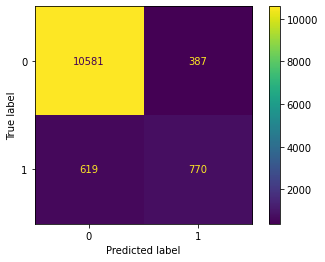

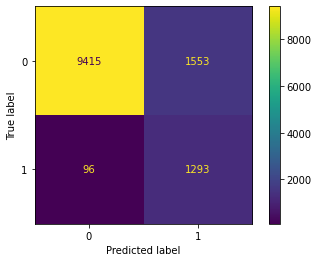

In [6]:
result_df = pd.DataFrame(
    {
        "Accuracy": accuracy,
        "Recall": recall,
        "Precision": precision,
        "F1 Score": f1,
        "Roc_Auc": roc_auc,
    },
    index=model_names,
)

create_table(result_df, index=True).show()

y_pred = catboost_base.predict(X_test)
default_cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=default_cm)
disp.plot()

y_pred = catboost_weighted.predict(X_test)
weighted_cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=weighted_cm)
disp.plot()


It looks like the weighted model perform much better at the classification process! As was previously pointed out, though, not all errors are created equal. How do these models compare in terms of expected profit?

# Using Expected Profit to Evaluate a Model

The expected profit of a model describes the average profit per person you could expect if you were to use the model. The formula used to calculate it is below.

$$
\mathrm{expected\:profit} = p(\mathrm{p}) \cdot \Big[ r(\mathrm{TP}) \cdot b(\mathrm{TP}) + r(\mathrm{FN}) \cdot b(\mathrm{FN}) \Big]  + p(\mathrm{n}) \cdot \Big[ r(\mathrm{TN}) \cdot b(\mathrm{TN}) + r(\mathrm{FP}) \cdot b(\mathrm{FP}) \Big]
$$ 

Where $p(\mathrm{p})$ is the probability of a positive response, $p(\mathrm{n})$ is the probability of a negative response. For the terms in the square brackets $r$ denotes a rate, and $b$ denotes a benefit value which can be positive or negative. For example, $r(\mathrm{TP}) \cdot b(\mathrm{TP})$ is the true positive rate times the benefit value of a true positive.

In [51]:
def calculate_expected_profit(cm, bm):
    tn, fp, fn, tp = cm.ravel()
    b_tn, b_fp, b_fn, b_tp = bm.ravel()

    total_samples = np.sum(cm.ravel())

    p_pos = (tp + fn) / total_samples
    p_neg = (tn + fp) / total_samples

    p_tp = tp / (tp + fn)
    p_tn = tn / (tn + fp)
    p_fp = 1 - p_tn
    p_fn = 1 - p_tp

    pos_term = p_pos * (p_tp * b_tp + p_fn * b_fn)
    neg_term = p_neg * (p_tn * b_tn + p_fp * b_fp)

    expected_profit = pos_term + neg_term

    return expected_profit


benefit_matrix = np.array([[0, -0.10], [0, 29.90]])


default_profit = round(
    calculate_expected_profit(default_cm, benefit_matrix), 2
)
weighted_profit = round(
    calculate_expected_profit(weighted_cm, benefit_matrix), 2
)

print(
    "Default Profit: {}\nWeighted Profit: {}".format(
        default_profit, weighted_profit
    )
)


Default Profit: 1.86
Weighted Profit: 3.12


These values indicate that if we used these models, and sent offers to people that the models classified as likely to respond to the offer, our profits would average out to about 1.86 USD per person when using the unweighted model and 3.12 USD per person when using the weighted model. It looks like the weighted model still performs better! We should really investigate a profit curve before we finalize that claim though.

# Calculating Profit Curves

What if instead of just predicting the class using the CatBoost classifier, we predicted the probability that someone falls into a given class. If we did that, we could choose our own threshold probability level and maybe eke out a little more profit! While doing this, we should also consider a benchmark case where we send an offer to everyone on our customer list. If that performs better than our model, why use the model at all?

In [52]:
# hide_output


def calculate_profit_curve(raw_df, labels, model, bm):

    df = raw_df.copy(deep=True)

    b_tn, b_fp, b_fn, b_tp = bm.ravel()

    y_pred = model.predict(df)
    y_pred_prob = model.predict_proba(df)
    df["pred_y"] = y_pred
    df["prob_y"] = y_pred_prob[:, 1]
    df["actual_y"] = labels
    df.sort_values("prob_y", ascending=False, inplace=True)

    df.reset_index(inplace=True)

    df_length_range = range(0, len(df))

    profit_list = []
    percentage_list = []
    for i in df_length_range:
        df_subset = df.iloc[: i + 1, :]
        cm = confusion_matrix(
            df_subset["actual_y"], df_subset["pred_y"], labels=[0, 1]
        )
        profit = calculate_expected_profit(cm, bm)
        profit_list.append(profit)
        percentage_list.append((i + 1) / len(df))

    bench_count_vals = df["actual_y"].value_counts()

    pos_vals = bench_count_vals[1] * b_tp
    neg_vals = bench_count_vals[0] * b_fp

    bench_val = (pos_vals + neg_vals) / len(df)

    df["benchmark_per_person"] = bench_val
    df["benchmark_total"] = df["benchmark_per_person"] * df.index
    df["percent_list"] = percentage_list
    df["profit_per_person"] = profit_list
    df["total_profit"] = df["profit_per_person"] * df.index

    df = df.fillna(0)

    return df


default_profit_df = calculate_profit_curve(
    X_test, y_test, catboost_base, benefit_matrix
)
weighted_profit_df = calculate_profit_curve(
    X_test, y_test, catboost_weighted, benefit_matrix
)


/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

invalid value encountered in long_scalars

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

invalid value encountered in long_scalars

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

invalid value encountered in long_scalars

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

invalid value encountered in long_scalars

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

invalid value encountered in long_scalars

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

invalid value encountered in long_scalars

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

invalid value encountered in

In [53]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.02)

fig.add_trace(
    go.Scatter(
        name="Default CatBoost",
        x=default_profit_df["percent_list"],
        y=default_profit_df["profit_per_person"],
    ),
    row=1,
    col=1,
)

fig.add_trace(
    go.Scatter(
        name="Weighted CatBoost",
        x=weighted_profit_df["percent_list"],
        y=weighted_profit_df["profit_per_person"],
    ),
    row=1,
    col=1,
)

fig.add_trace(
    go.Scatter(
        name="Send All Benchmark",
        x=weighted_profit_df["percent_list"],
        y=weighted_profit_df["benchmark_per_person"],
    ),
    row=1,
    col=1,
)


fig.add_trace(
    go.Scatter(
        name="Default CatBoost",
        x=default_profit_df["percent_list"],
        y=default_profit_df["total_profit"],
    ),
    row=2,
    col=1,
)

fig.add_trace(
    go.Scatter(
        name="Weighted CatBoost",
        x=weighted_profit_df["percent_list"],
        y=weighted_profit_df["total_profit"],
    ),
    row=2,
    col=1,
)

fig.add_trace(
    go.Scatter(
        name="Send All Benchmark",
        x=weighted_profit_df["percent_list"],
        y=weighted_profit_df["benchmark_total"],
    ),
    row=2,
    col=1,
)

fig.update_layout(
    title="Model Profit Comparison",
    showlegend=True,
)

fig.update_yaxes(title_text="Profit Per Person (USD)", row=1, col=1)
fig.update_yaxes(title_text="Total Profit (USD)", row=2, col=1)

fig.show()


Both model perform better than the benchmark, that's great news! It looks like the best profit we can find here is to use the weighted model and to set the threshold at about 22&percnt;. Using that value we get a profit of approximately 14 USD per person with a decent tradeoff on actual trigger pulls that would net us 38k USD over the ~12.5k person sample size tested. What does it look like if we were selling a product with a much poorer profit margin though, say 0.30 USD?

In [54]:
# hide_output
benefit_matrix = np.array([[0, -0.10], [0, 0.30]])

default_profit_df = calculate_profit_curve(
    X_test, y_test, catboost_base, benefit_matrix
)
weighted_profit_df = calculate_profit_curve(
    X_test, y_test, catboost_weighted, benefit_matrix
)


/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

invalid value encountered in long_scalars

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

invalid value encountered in long_scalars

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

invalid value encountered in long_scalars

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

invalid value encountered in long_scalars

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

invalid value encountered in long_scalars

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

invalid value encountered in long_scalars

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning:

invalid value encountered in

In [59]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.02)

fig.add_trace(
    go.Scatter(
        name="Default CatBoost",
        x=default_profit_df["percent_list"],
        y=default_profit_df["profit_per_person"],
    ),
    row=1,
    col=1,
)

fig.add_trace(
    go.Scatter(
        name="Weighted CatBoost",
        x=weighted_profit_df["percent_list"],
        y=weighted_profit_df["profit_per_person"],
    ),
    row=1,
    col=1,
)

fig.add_trace(
    go.Scatter(
        name="Send All Benchmark",
        x=weighted_profit_df["percent_list"],
        y=weighted_profit_df["benchmark_per_person"],
    ),
    row=1,
    col=1,
)


fig.add_trace(
    go.Scatter(
        name="Default CatBoost",
        x=default_profit_df["percent_list"],
        y=default_profit_df["total_profit"],
    ),
    row=2,
    col=1,
)

fig.add_trace(
    go.Scatter(
        name="Weighted CatBoost",
        x=weighted_profit_df["percent_list"],
        y=weighted_profit_df["total_profit"],
    ),
    row=2,
    col=1,
)

fig.add_trace(
    go.Scatter(
        name="Send All Benchmark",
        x=weighted_profit_df["percent_list"],
        y=weighted_profit_df["benchmark_total"],
    ),
    row=2,
    col=1,
)

fig.update_layout(
    title="Model Profit Comparison, Poor Profit Margin",
    showlegend=True,
)

fig.update_yaxes(title_text="Profit Per Person (USD)", row=1, col=1)
fig.update_yaxes(title_text="Total Profit (USD)", row=2, col=1)

fig.show()


This plot shows the value that can be found in machine learning. Using a product with extermely low profit margins, and an offer that has a very low response rate, the model is still able to extract some profit from the customer base. Now, these values aren't anything you would actually run with in the real world but it's still impressive that this model is able to generate any profit when considering the apparent no-win scenario illustrated by the benchmark.

# Working Inside a Budget

Finally, in the real world we often have to consider constraints, the largest of which is often a budget. Let's say we only have 150 USD to use on this campaign. We know that each message we send costs us 0.10 USD, so that lets us send 1500 offers. Figuring out the optimal model and threshold value is as simple as taking the ratio of offers in the budget to the total number of customers in the dataset.

In [58]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.02)

fig.add_trace(
    go.Scatter(
        name="Default CatBoost",
        x=default_profit_df["percent_list"],
        y=default_profit_df["profit_per_person"],
    ),
    row=1,
    col=1,
)

fig.add_trace(
    go.Scatter(
        name="Weighted CatBoost",
        x=weighted_profit_df["percent_list"],
        y=weighted_profit_df["profit_per_person"],
    ),
    row=1,
    col=1,
)

fig.add_trace(
    go.Scatter(
        name="Send All Benchmark",
        x=weighted_profit_df["percent_list"],
        y=weighted_profit_df["benchmark_per_person"],
    ),
    row=1,
    col=1,
)


fig.add_trace(
    go.Scatter(
        name="Default CatBoost",
        x=default_profit_df["percent_list"],
        y=default_profit_df["total_profit"],
    ),
    row=2,
    col=1,
)

fig.add_trace(
    go.Scatter(
        name="Weighted CatBoost",
        x=weighted_profit_df["percent_list"],
        y=weighted_profit_df["total_profit"],
    ),
    row=2,
    col=1,
)

fig.add_trace(
    go.Scatter(
        name="Send All Benchmark",
        x=weighted_profit_df["percent_list"],
        y=weighted_profit_df["benchmark_total"],
    ),
    row=2,
    col=1,
)

fig.update_layout(
    title="Model Profit Comparison, Poor Profit Margin, Fixed Budget",
    showlegend=True,
)

fig.update_yaxes(title_text="Profit Per Person (USD)", row=1, col=1)
fig.update_yaxes(title_text="Total Profit (USD)", row=2, col=1)

fig.add_vline(
    x=1500 / len(X_test), line_width=3, line_dash="dash", line_color="green"
)

fig.show()


This shows us that the optimal model for our poor profit margin product is still the weighted model, and that we should set the threshold to approximately &percnt;12.

# Wrapping Up

It's important for us data scientist types to take a look around at the real world every now and again, to figure out how we can use our skills to better help those around us. Stats and model building can be incredibly fun, but if you're not careful you can end up in a situation where you're basically just optimizing imaginary scenarios. Hopefully this article helps some people think a little more about the world we live in.

As always, I encourage everyone reading this to [grab the data](https://github.com/borsboomT/datasets) and play with it yourself. See if you can make a model that makes more profit than mine!